In [14]:
import sys
import os
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import PIL
from glob import glob


from IPython.display import display, Image

from io import BytesIO

def display_img_array(ima):
    im = PIL.Image.fromarray(ima)
    bio = BytesIO()
    im.save(bio, format='png')
    display(Image(bio.getvalue(), format='png', retina=True))
    


sys.path.append(os.path.abspath("/mnt/w/prj/GraduateWork/scripts/"))
sys.path.append(os.path.abspath("/home/sole/prj/GraduateWork/day2night/CycleGAN/scripts/eval_cityscapes"))

from ImageDiff.compare import ImageDiff

imd = ImageDiff(grayscale=False)

ssim = imd.ssim
mse = imd.mse
psnr = imd.psnr
def show(*images, plot=False):
    if plot:
        for im in images:
            print(im.shape)
            plt.figure()
            plt.imshow(im, cmap="gray")
    else:
        for im in images:
            print(im.shape)
            display_img_array(im)

In [2]:
real_dir = '/mnt/w/prj/GraduateWork/scripts/Any2Gif/img/day_orig/'

In [8]:
%cd /home/sole/prj/GraduateWork/day2night/CycleGAN
!python scripts/eval_cityscapes/evaluate.py --cityscapes_dir {real_dir} \
                                            --result_dir {real_dir} \
                                            --output_dir ./out \
                                            --save_output_images 1

/mnt/w/prj/GraduateWork/day2night/CycleGAN
W0509 15:10:05.491370 31203 _caffe.cpp:139] DEPRECATION WARNING - deprecated use of Python interface
W0509 15:10:05.491394 31203 _caffe.cpp:140] Use this instead (with the named "weights" parameter):
W0509 15:10:05.491397 31203 _caffe.cpp:142] Net('./scripts/eval_cityscapes/caffemodel//deploy.prototxt', 1, weights='./scripts/eval_cityscapes/caffemodel/fcn-8s-cityscapes.caffemodel')
I0509 15:10:05.492985 31203 net.cpp:51] Initializing net from parameters: 
state {
  phase: TEST
  level: 0
}
layer {
  name: "data"
  type: "Input"
  top: "data"
  input_param {
    shape {
      dim: 1
      dim: 3
      dim: 500
      dim: 500
    }
  }
}
layer {
  name: "conv1_1"
  type: "Convolution"
  bottom: "data"
  top: "conv1_1"
  param {
    lr_mult: 1
    decay_mult: 1
  }
  param {
    lr_mult: 2
    decay_mult: 0
  }
  convolution_param {
    num_output: 64
    pad: 100
    kernel_size: 3
    stride: 1
    weight_filler {
      type: "gaussian"
      s

I0509 15:10:06.363199 31203 net.cpp:122] Setting up conv1_1
I0509 15:10:06.363224 31203 net.cpp:129] Top shape: 1 64 698 698 (31181056)
I0509 15:10:06.363226 31203 net.cpp:137] Memory required for data: 133724224
I0509 15:10:06.363236 31203 layer_factory.hpp:77] Creating layer relu1_1
I0509 15:10:06.363245 31203 net.cpp:84] Creating Layer relu1_1
I0509 15:10:06.363248 31203 net.cpp:406] relu1_1 <- conv1_1
I0509 15:10:06.363252 31203 net.cpp:367] relu1_1 -> conv1_1 (in-place)
I0509 15:10:06.363642 31203 net.cpp:122] Setting up relu1_1
I0509 15:10:06.363652 31203 net.cpp:129] Top shape: 1 64 698 698 (31181056)
I0509 15:10:06.363656 31203 net.cpp:137] Memory required for data: 258448448
I0509 15:10:06.363658 31203 layer_factory.hpp:77] Creating layer conv1_2
I0509 15:10:06.363667 31203 net.cpp:84] Creating Layer conv1_2
I0509 15:10:06.363672 31203 net.cpp:406] conv1_2 <- conv1_1
I0509 15:10:06.363675 31203 net.cpp:380] conv1_2 -> conv1_2
I0509 15:10:06.366134 31203 net.cpp:122] Setting up

I0509 15:10:06.443439 31203 net.cpp:122] Setting up conv4_3
I0509 15:10:06.443461 31203 net.cpp:129] Top shape: 1 512 88 88 (3964928)
I0509 15:10:06.443464 31203 net.cpp:137] Memory required for data: 1095454528
I0509 15:10:06.443472 31203 layer_factory.hpp:77] Creating layer relu4_3
I0509 15:10:06.443480 31203 net.cpp:84] Creating Layer relu4_3
I0509 15:10:06.443483 31203 net.cpp:406] relu4_3 <- conv4_3
I0509 15:10:06.443488 31203 net.cpp:367] relu4_3 -> conv4_3 (in-place)
I0509 15:10:06.445024 31203 net.cpp:122] Setting up relu4_3
I0509 15:10:06.445039 31203 net.cpp:129] Top shape: 1 512 88 88 (3964928)
I0509 15:10:06.445042 31203 net.cpp:137] Memory required for data: 1111314240
I0509 15:10:06.445046 31203 layer_factory.hpp:77] Creating layer pool4
I0509 15:10:06.445051 31203 net.cpp:84] Creating Layer pool4
I0509 15:10:06.445055 31203 net.cpp:406] pool4 <- conv4_3
I0509 15:10:06.445062 31203 net.cpp:380] pool4 -> pool4
I0509 15:10:06.445096 31203 net.cpp:122] Setting up pool4
I0509

I0509 15:10:07.677062 31203 net.cpp:744] Ignoring source layer loss


In [16]:
path = '/mnt/w/prj/GraduateWork/day2night/UNIT/checkpoints/vgg/out_b2a/'
path2 = '/mnt/w/prj/GraduateWork/day2night/UNIT/checkpoints/vgg/out_b2a/input'
images = imd.load_images(path)
images = imd.load_images(path2)

In [15]:
imd.clean(full=True)
images = []

SSIM: 0.49540449809803294
MSE: 16962.240437437995
PSNR: 5.835971458862406
(512, 2520, 3)


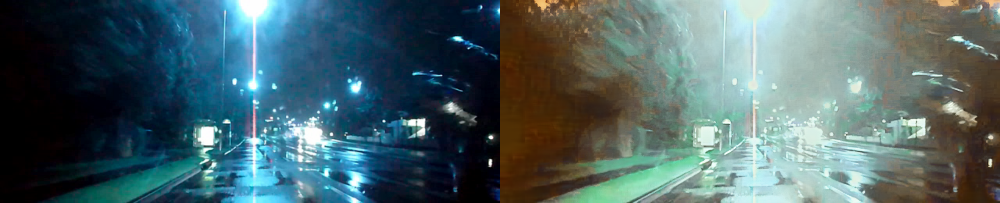

SSIM: 0.47834421646486486
MSE: 17923.166302393354
PSNR: 5.596656264018922
(512, 2520, 3)


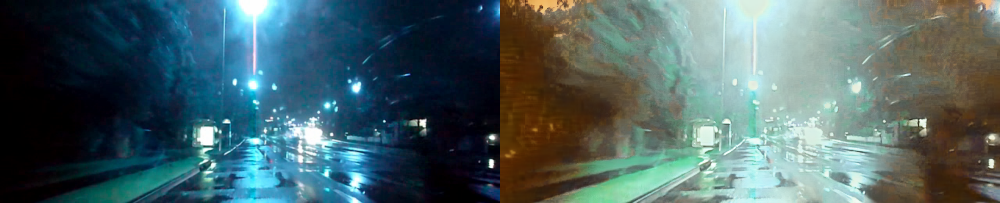

SSIM: 0.4721217904924974
MSE: 17199.55271577381
PSNR: 5.775632078904246
(512, 2520, 3)


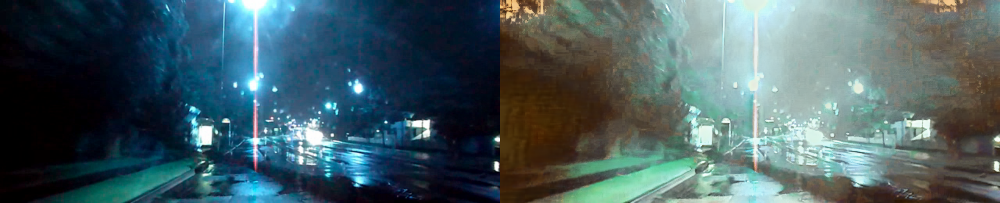

SSIM: 0.492176035216845
MSE: 18895.152566964287
PSNR: 5.367299579346332
(512, 2520, 3)


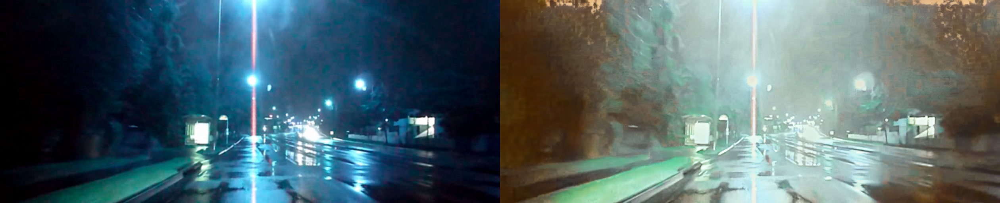

SSIM: 0.421899045576243
MSE: 15566.60343656994
PSNR: 6.208864990817091
(512, 2520, 3)


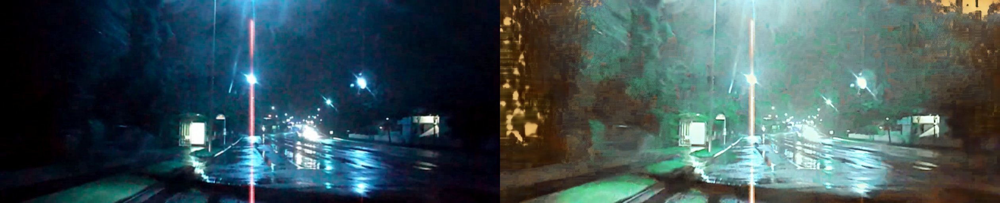

SSIM: 0.5016303423585041
MSE: 17483.10267702133
PSNR: 5.704618527104829
(512, 2520, 3)


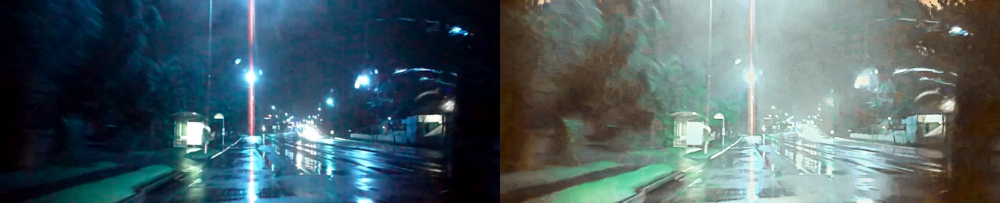

In [17]:
n = 5
for i, (name,v) in enumerate(images.items()):
    if len(v['images']) == 2:
        im1 = v['images'][1]
        im2 = v['images'][0]
        print('SSIM:', ssim(im1, im2))
        print('MSE:', mse(im1, im2))
        print('PSNR:', psnr(im1, im2))
        c = imd.get_concated(im1, im2)
    else:
        print('No pair for', name)
    show(c)
    if i == n:
        break

In [ ]:
print('SSIM:', ssim(im1, im2))
print('MSE:', mse(im1, im2))
print('PSNR:', psnr(im1, im2))